##### Copyright 2026 Google LLC.

In [1]:
# @title Licensed under the Apache License, Version 2.0 (the "License");
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Gemini API: Get started with Lyria 3 🎵

<a target="_blank" href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/Get_started_Lyria.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" height=30/></a>

This notebook will show you how to generate high-fidelity music with **Lyria 3**, Google DeepMind's family of music generation models.

Whether you need a short 30-second jingle or a full-length 3-minute song with vocals and structural complexity, Lyria 3 makes it possible with the same simple `generate_content` call you're already familiar with.

In this notebook, you will learn how to:
- Generate music from text prompts.
- Create "visual soundtracks" where an image serves as the inspiration.
- Use advanced timestamped prompts to control song structure.
- Generate purely instrumental tracks.
- Create vocal tracks in multiple languages.

This guide will walk you through generating your first hit song using the GenaI SDK and both the current API and the new [interactions](#interactions) ones

> **Note:** This notebook uses the [Interactions API](https://ai.google.dev/gemini-api/docs/interactions), the latest way to interact with Gemini models. Looking for the `generateContent` version? Check the [archive branch](https://github.com/google-gemini/cookbook/blob/archive/generate-content-api/quickstarts/Get_started_Lyria.ipynb).

<a name="setup"></a>
## Setup

### Install SDK

Install the SDK from [PyPI](https://github.com/googleapis/python-genai). It's recommended to always use the latest version.

In [2]:
%pip install -U -q "google-genai>=2.9.0" # 1.62 is needed for music generation

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.5/53.5 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.4/109.4 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.4/252.4 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 472.3/472.3 kB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 68.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires google-auth==2.47.0, but you have google-auth 2.55.0 which is incompatible.
gradio 5.50.0 requires pydantic<=2.12.3,>=2.0, but you have pydantic 2.13.4 which is incompatible.
google-adk 1.29.0 requires google-genai<2.0.0,>=1.64.0, but you have google-genai 2.9.0 which is incompatible.


### Setup your API key

To run the following cell, your API key must be stored in a Colab Secret named `GEMINI_API_KEY`. If you don't already have an API key or you aren't sure how to create a Colab Secret, see [Authentication ![image](https://storage.googleapis.com/generativeai-downloads/images/colab_icon16.png)](../quickstarts/Authentication.ipynb) for a walkthrough.

In [3]:
from google.colab import userdata

GEMINI_API_KEY = userdata.get('GEMINI_API_KEY')

### Initialize SDK client

With the new SDK, now you only need to initialize a client with your API key (or OAuth if using [Vertex AI](https://cloud.google.com/vertex-ai)). The model is now set in each call.

In [4]:
from google import genai
from google.genai import types

client = genai.Client(api_key=GEMINI_API_KEY)

## Select a model

There are 2 tasty flavors of this model you can use:
*   `lyria-3-clip-preview`: Perfect for quick 30-second clips, loops, and experiments. ⏱️
*   `lyria-3-pro-preview`: Generates full songs (up to 3 minutes) with structure (intro, verse, chorus!). 🎼

More details in the [documentation](https://ai.google.dev/gemini-api/docs/music-generation).

In [5]:
MODEL_ID = "lyria-3-clip-preview" # @param ["lyria-3-clip-preview","lyria-3-pro-preview"] {"allow-input":true}

## Generate your first song

Generating a song is straightforward using the `interactions.create` call. You MUST specify the `Audio` and `Text` modalities in the configuration to receive the audio data and the generated lyrics/structure.

In [41]:
prompt = "Create a 30-second cheerful acoustic folk song about a sunrise in the mountains." # @param {type:"string"}


interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
    response_modalities=['audio', 'text'] # To get both lyrics and the song, this is the default setting
)


### Parsing the output

The output will contain both text and audio parts:

In [42]:
for step in interaction.steps:
  print(step)

type='model_output' content=[TextContent(text="[0.0:] Cold air on my face\n[2.4:] In this quiet place\n[4.8:] The peaks are dark and grey\n[7.2:] Waiting for the day\n[9.6:] A line of golden light\n[12.0:] Is pushin' back the night\n[14.4:] The world begins to glow\n[16.8:] A peaceful, happy show\n[19.2:] A brand new day is here\n[21.6:] Oh, a brand new day is here", type='text', annotations=None)]
type='model_output' content=[AudioContent(type='audio', data='SUQzAwAAAAAvMkdFT0IAABeoAAAAYXBwbGljYXRpb24vYzJwYQBjMnBhAGMycGEgbWFuaWZlc3Qgc3RvcmUAAAAXfWp1bWIAAAAeanVtZGMycGEAEQAQgAAAqgA4m3EDYzJwYQAAABdXanVtYgAAAEdqdW1kYzJtYQARABCAAACqADibcQN1cm46YzJwYTo1YTAwODNlNi00MDczLWE3YzUtZDY1NC00Nzc4NDE5MGYyYjEAAAATAGp1bWIAAAAoanVtZGMyY3MAEQAQgAAAqgA4m3EDYzJwYS5zaWduYXR1cmUAAAAS0GNib3LShFkGK6IBJhghglkDPzCCAzswggLAoAMCAQICFACerxVigalJAhZbSP9YqW0kmB7OMAoGCCqGSM49BAMDMFExCzAJBgNVBAYTAlVTMRMwEQYDVQQKDApHb29nbGUgTExDMS0wKwYDVQQDDCRHb29nbGUgQzJQQSBNZWRpYSBTZXJ2aWNlcyAxUCBJQ0EgRzMwHhcNMjYwMjE3MTUxNzEyWhcNMjcw

The text part of the output contains the lyrics:

In [43]:
# Lyrics
print(interaction.output_text)

[0.0:] Cold air on my face
[2.4:] In this quiet place
[4.8:] The peaks are dark and grey
[7.2:] Waiting for the day
[9.6:] A line of golden light
[12.0:] Is pushin' back the night
[14.4:] The world begins to glow
[16.8:] A peaceful, happy show
[19.2:] A brand new day is here
[21.6:] Oh, a brand new day is here


The audio part of the output contains the audio file in base64:

In [44]:
from IPython.display import display, Audio
import base64

audio_bytes = interaction.output_audio.data
display(Audio(base64.b64decode(audio_bytes), rate=24000))

#### Util

Let's now create a utility function to do all of that parsing at all:

In [45]:
from IPython.display import display, Audio
import json
import base64

def display_lyria_response(interaction):
    # Display Lyrics or Text
    if hasattr(interaction, "output_text") and interaction.output_text:
        print("🎤 Lyrics / Structure:")
        print(interaction.output_text)
        print()

    # Play the audio
    if hasattr(interaction, "output_audio") and interaction.output_audio:
        print("🔊 Playing generated audio:")
        audio_bytes = interaction.output_audio.data
        display(Audio(data=base64.b64decode(audio_bytes), rate=48000))
    else:
        print("No audio data found in the response.")

In [46]:
display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:] Cold air on my face
[2.4:] In this quiet place
[4.8:] The peaks are dark and grey
[7.2:] Waiting for the day
[9.6:] A line of golden light
[12.0:] Is pushin' back the night
[14.4:] The world begins to glow
[16.8:] A peaceful, happy show
[19.2:] A brand new day is here
[21.6:] Oh, a brand new day is here

🔊 Playing generated audio:


## Visual inspiration: Image-to-Music 🖼️➡️🎵

Lyria 3 can "invent" a song from a visual cue. Passing an image (actually up to 10 images) in the `contents` list gives the model a whole new dimension of creativity. Let's see how a grocery list can inspire a song.

First, download a test image:

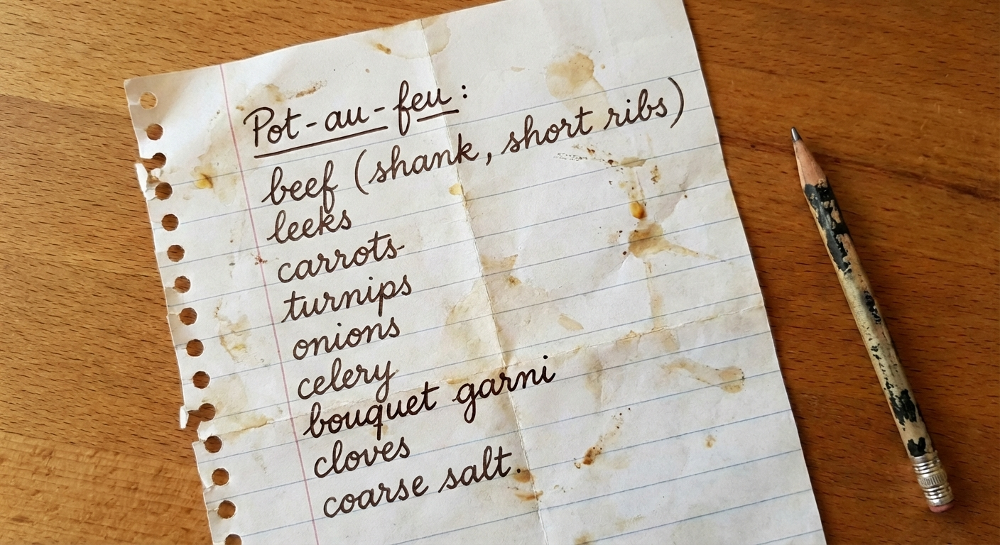

🎤 Lyrics / Structure:
[0.0:] FOR SHANK AND SHORT RIBS, OUR QUEST IS BEGUN!
[4.8:] WE MARCH FOR THE LEEKS AND THE CARROTS, MY SON!
[9.6:] TURNIPS AND CELERY, OUR HEARTS ARE ABLAZE!
[14.4:] FOR THE GARNI BOUQUET, THROUGH THE MAZE!
[19.2:] THE CLOVES AND THE SALT, OUR DESTINY CALLS!
[24.0:29.8] POT-AU-FEU! POT-AU-FEU!

🔊 Playing generated audio:


In [19]:
from PIL import Image
import requests
from io import BytesIO
from IPython.display import display

# The image URL
url = "https://storage.googleapis.com/generativeai-downloads/images/groceries.jpeg"

# Download and display the image
image_response = requests.get(url)
image = Image.open(BytesIO(image_response.content))
display(image)

# Generate music inspired by the image using the interactions API with structured input
interaction = client.interactions.create(
    model=MODEL_ID,
    input=[
        {"type": "text", "text": "An epic song with opera voices about this quest. Deep synths and a speeding up tempo."},
        {"type": "image", "uri": url}
    ]
)

# Display audio from the response
display_lyria_response(interaction)


<a name="generatecontent"></a>

## Using the generateContent API

You can also use the `generateContent` API directly. Here's a quick example:

```python
response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=['Audio', 'Text']
    )
)
```

The response structure is slightly different — check the [generateContent notebook](./Get_started_Generate_Content.ipynb) for details.

## Priompting tips

### BPM (Beats-per-minute)

Tell Lyria which BPM you want according to the style and the rythm you want, from very slow jazz song to very fast German techno.

In [21]:
prompt = """
  Create an energetic German techno track at 180 BPM. Feature a Risset accelerando illusion with overlapping, accelerating kick drums and industrial synths that sound like they are endlessly speeding up.
"""

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
<instrumental>

🔊 Playing generated audio:


### Timing ⏱

You can specify exactly what happens at specific moments in the song using timestamps. This is useful for distributing lyrics or controlling instrumental shifts as the composition develops.

Let's tell the model what to do in each 10-second block of a song:

In [22]:
prompt = """
  [0:00 - 0:10] Fast acoustic guitar arpeggios, setting an energetic tone.
  [0:10 - 0:20] Add a warm Fender Rhodes piano melody.
  [0:20 - 0:30] Full band with upbeat drums and soaring synth leads.
"""

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
<instrumental>

🔊 Playing generated audio:


### Music structure

You can also give the song structure using `[Intro]`, `[Verse]`, `[Chorus]`, `[Bridge]`, `[Outro]`:

In [23]:
prompt = """
  [Intro] Calm piano music setting a sunset scene on the beach
  [Verse] Epic rock balade as the storm rages.
  [Outro] Opera with choir as the sun reappears again through the black clouds .
"""

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:] (Ooh) Through the darkness, a promise breaks,
[5.3:] A golden dawn the sky remakes!
[10.7:] THE SHADOWS FLEE, THE HEAVENS SING,
[16.0:] A NEW CREATION ON ITS WING!

🔊 Playing generated audio:


### Control the intensity and the scale of each part of the song (full example)

Not only can you prompt each part separately, but you can also set the intensite and the scale for each of them. Here's a full example of a complex prompt:

In [24]:
prompt = """
  [0:00 - 0:12] Intro: Begin atmospherically with just the Fender Rhodes playing
  soft chords (Cm7, Fm7). Drench it in warm reverb and introduce a light
  atmospheric texture. The mood is hazy, like a memory coming into focus.
  Intensity: 1/10 (Very Low)

  [0:12 - 0:24] Verse 1: The laid-back drum beat enters with a simple kick and
  snare. A soft, ethereal synth pad swells in the background. A clean, subtle
  sub-bass joins, adding depth. The Rhodes melody becomes slightly more defined
  over a | Cm7 | Fm7 | G7alt | Cm7 | progression. Intensity: 3/10 (Low)

  [0:24 - 0:36] Build: The groove deepens as a gentle, syncopated hi-hat is
  added. A simple, memorable lead melody appears, played on a warm, rounded
  synth. This section should feel like the gentle peak of the track's focus,
  flowing through an | Abmaj7 | G7alt | Cm7 | Ebmaj7 | progression. Intensity:
  5/10 (Medium)

  [0:36 - 0:48] Chorus: Gracefully pull back the intensity. The synth lead
  melody fades out, returning focus to the core Rhodes groove and the drums.
  This gives the track space to breathe over an | Fm7 | Ebmaj7 | Abmaj7 | G7alt
  | progression. Intensity: 4/10 (Medium-Low)

  [0:48 - 1:00] Outro: The drums and bass drop out completely. The track fades
  out leaving only the Rhodes playing spacious chords, the lingering synth pad,
  and the persistent atmospheric texture. Intensity: 2/10 (Very Low)

"""

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:5.6] Faded film on a summer screen,
[5.6:11.3] Painting a forgotten dream.
[11.3:16.9] That golden hour light that fell on you,
[16.9:22.6] A perfect moment, soft and new.
[22.6:28.2] (A perfect moment, soft and new...)

🔊 Playing generated audio:


## Control the lyrics

### Provide the lyrics

You can provide the lyrics you want in the prompt. Just make sure to clearly stat what's lyrics and what's prompt for the music.

In [25]:
prompt = """
  An uplifting song with guitar rifts about nano banana.
  The lyrics should be:
    Yellow peel, a tiny sweet, The Nano Banana, a tropical treat. But wait—it
    hums, it starts to create, Switching into AI mode. Not a fruit, but a smart
    machine, The bananiest model you've ever seen.
"""

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:6.0] Yellow peel, a tiny sweet, The Nano Banana, a tropical treat.
[6.0:12.0] But wait—it hums, it starts to create, Switching into AI mode.
[12.0:18.0] Not a fruit, but a smart machine,
[18.0:24.0] The bananiest model you've ever seen.

🔊 Playing generated audio:


### Use the model reasoning capabilities to come up with lyrics

You can also let the model come up with lyrics about all kind of topics:

In [33]:
prompt = "A serious moment in a classical play" # @param {type:"string"}

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
    response_modalities=['audio', 'text']
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:8.0] Is this the moment, then? The final, dreadful truth?
[8.0:16.0] My soul laid bare before this silent stone.
[16.0:24.0] Oh, what a king I was... and what a fool.

🔊 Playing generated audio:


### Create songs in different languages 🌍🎤

Lyria 3 generates lyrics in the language it sees in your prompt. By providing instructions in French, Spanish, or Japanese, the model will produce a vocal performance that matches the pronunciation and emotional tone of that language. Let's create a disco track in Spanish and French:

In [34]:
prompt = "Tell me how bubble sort works as a disco song in spanish and french." # @param {type:"string"}

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
[0.0:2.0] Prenez la liste, mes amis
[2.0:4.0] La danse commence ici
[4.0:6.0] Comparamos, un dos
[6.0:8.0] ¡Y los movemos! ¡Qué gozo!
[8.0:10.0] If the number is too big
[10.0:12.0] Then you do the disco switch
[12.0:14.0] On refait tout le chemin
[14.0:16.0] C'est le groove du destin
[16.0:18.0] Una pasada más
[18.0:20.0] ¡Hasta el final! You've got class!
[20.0:22.0] C'est le Bubble Sort (Ooh la la)
[22.0:24.0] ¡Con el Bubble Sort! (¡Olé!)

🔊 Playing generated audio:


## Instrumental-only generation 🎹

For background music, soundtracks, or game loops where vocals aren't needed, you can use the `instrumental_only` parameter. This is faster than adding "instrumental" to your prompt and ensures a vocal-free track.

In [35]:
prompt = "Create a looping medidation music that feels like the wind." # @param {type:"string"}

interaction = client.interactions.create(
    model=MODEL_ID,
    input=prompt,
)

display_lyria_response(interaction)

🎤 Lyrics / Structure:
<instrumental>

🔊 Playing generated audio:


## What's next?

- Listen to your creations! 🎧
- Explore [Google AI Studio](https://aistudio.google.com/new_music) to iterate on your prompts visually.
- Check those cool AI Studio apps: [Lyria Studio](https://aistudio.google.com/apps/bundled/lyria_studio) where you can create songs wand generate karaoke versions of them and [Lyria rhythm](https://aistudio.google.com/apps/bundled/lyria_rhythm) that create custom song for a rhythm game.
- Combine music generation with [image generation](https://ai.google.dev/gemini-api/docs/image-generation) for full multimedia content.
- Dive into the [Lyria 3 technical report](https://deepmind.google/technologies/lyria/) to learn about the architecture behind these models.